In [1]:
import numpy as np
import pickle
from ArcParams_class import ArcParams
import utils

filename = 'cqpsg08267h0008fhtj0_basis_xz_logical_0_IQ.p'
with open('data/IQ_data/' + filename, 'rb') as f:
    data = pickle.load(f)

with open('data/params/' + filename, 'rb') as f:
    params = pickle.load(f)


cor_data = []
for idx, data_list in enumerate(data):
    vstack = np.vstack(data_list)
    if idx != 4:
        vstack = vstack[:,vstack.shape[1]//2:]
    cor_data.append(vstack)

for data in cor_data:
    print(data.shape)


(1000, 127)
(1000, 127)
(1000, 254)
(1000, 254)
(100, 7154)


In [96]:
import numpy as np
all_memories = {qubit: {} for qubit in range(127)}
all_memories_dbl = {qubit: {} for qubit in range(127)}

for qubit in all_memories.keys():
    # all_memories[qubit]['mmr_0'] = np.hstack([cor_data[0][:, qubit], cor_data[2][:, qubit], cor_data[2][:, qubit+127]])
    # all_memories[qubit]['mmr_1'] = np.hstack([cor_data[1][:, qubit], cor_data[3][:, qubit], cor_data[3][:, qubit+127]])
    all_memories[qubit]['mmr_0'] = np.hstack([cor_data[0][:, qubit], cor_data[2][:, qubit]])
    all_memories[qubit]['mmr_1'] = np.hstack([cor_data[1][:, qubit], cor_data[3][:, qubit] ])
    all_memories_dbl[qubit]['mmr_0'] = cor_data[2][:, qubit]
    all_memories_dbl[qubit]['mmr_1'] = cor_data[3][:, qubit]
    all_memories_dbl[qubit]['mmr_0_scnd'] = cor_data[2][:, qubit+127]
    all_memories_dbl[qubit]['mmr_1_scnd'] = cor_data[3][:, qubit+127]

print('all_memories')
for key, value in all_memories[0].items():
    print(key, value.shape)
print('\nall_memories_dbl')
for key, value in all_memories_dbl[0].items():
    print(key, value.shape)

all_memories
mmr_0 (2000,)
mmr_1 (2000,)

all_memories_dbl
mmr_0 (1000,)
mmr_1 (1000,)
mmr_0_scnd (1000,)
mmr_1_scnd (1000,)


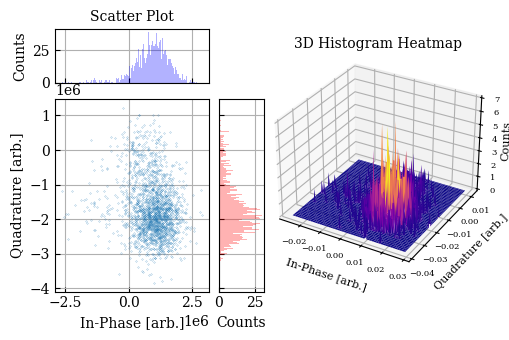

In [98]:
from soft_info import plot_IQ_data

plot = plot_IQ_data(all_memories[9]['mmr_1'])

In [99]:
from qiskit_qec.circuits import ArcCircuit
# import ordered sets

code = ArcCircuit(links=params.links, T=params.T, basis=params.basis, logical=params.logical, resets=params.resets,
                      color=params.color, schedule=params.schedule, run_202=params.run_202)

code_qubits = set()
ancilla_qubits = set()
for link in code.links:
    code_qubits.add(link[0])
    code_qubits.add(link[2])
    ancilla_qubits.add(link[1])

code_qubits = list(code_qubits)
ancilla_qubits = list(ancilla_qubits)


print(f"len code_qubits = {len(code_qubits)}")
print(f"len ancilla_qubits = {len(ancilla_qubits)}")
print(f"code qubits = {code_qubits}")
print(f"ancilla qubits = {ancilla_qubits}")

print()
print(f"T*len(ancilla_qubits)+len(code_qubits) = {params.T*len(ancilla_qubits)+len(code_qubits)}")
print(f"shape ArcData: {cor_data[4].shape}")

len code_qubits = 54
len ancilla_qubits = 71
code qubits = [0, 2, 4, 6, 8, 10, 12, 18, 20, 22, 24, 26, 28, 30, 32, 37, 39, 41, 43, 45, 47, 49, 51, 56, 58, 60, 62, 64, 66, 68, 70, 75, 77, 79, 81, 83, 85, 87, 89, 94, 96, 98, 100, 102, 104, 106, 108, 114, 116, 118, 120, 122, 124, 126]
ancilla qubits = [1, 3, 5, 7, 9, 11, 14, 15, 16, 17, 19, 21, 23, 25, 27, 29, 31, 33, 34, 35, 36, 38, 40, 42, 44, 46, 48, 50, 52, 53, 54, 55, 57, 59, 61, 63, 65, 67, 69, 71, 72, 73, 74, 76, 78, 80, 82, 84, 86, 88, 90, 91, 92, 93, 95, 97, 99, 101, 103, 105, 107, 109, 110, 111, 112, 115, 117, 119, 121, 123, 125]

T*len(ancilla_qubits)+len(code_qubits) = 7154
shape ArcData: (100, 7154)


# Get KDEs

In [100]:
import cpp_soft_info as csi

bandwidths = [0.6]
# bandwidths = np.linspace(0.1, 1.0, 30)
num_points = 51

kde_dict = csi.get_KDEs(all_memories, bandwidths, relError=1, absError=-1, num_points=num_points)

In [102]:
# inverted_q_map
from soft_info import inv_qubit_mapping
memory = cor_data[4]

qubit_mapping = {}
for idx in range(memory.shape[1]):
    if idx < code.T * len(ancilla_qubits):
        qubit_mapping[idx] = ancilla_qubits[idx % len(ancilla_qubits)]
    else:
        qubit_mapping[idx] = code_qubits[idx - code.T * len(ancilla_qubits)]

print(qubit_mapping)
inverted_q_map = inv_qubit_mapping(qubit_mapping)
print(inverted_q_map)

{0: 1, 1: 3, 2: 5, 3: 7, 4: 9, 5: 11, 6: 14, 7: 15, 8: 16, 9: 17, 10: 19, 11: 21, 12: 23, 13: 25, 14: 27, 15: 29, 16: 31, 17: 33, 18: 34, 19: 35, 20: 36, 21: 38, 22: 40, 23: 42, 24: 44, 25: 46, 26: 48, 27: 50, 28: 52, 29: 53, 30: 54, 31: 55, 32: 57, 33: 59, 34: 61, 35: 63, 36: 65, 37: 67, 38: 69, 39: 71, 40: 72, 41: 73, 42: 74, 43: 76, 44: 78, 45: 80, 46: 82, 47: 84, 48: 86, 49: 88, 50: 90, 51: 91, 52: 92, 53: 93, 54: 95, 55: 97, 56: 99, 57: 101, 58: 103, 59: 105, 60: 107, 61: 109, 62: 110, 63: 111, 64: 112, 65: 115, 66: 117, 67: 119, 68: 121, 69: 123, 70: 125, 71: 1, 72: 3, 73: 5, 74: 7, 75: 9, 76: 11, 77: 14, 78: 15, 79: 16, 80: 17, 81: 19, 82: 21, 83: 23, 84: 25, 85: 27, 86: 29, 87: 31, 88: 33, 89: 34, 90: 35, 91: 36, 92: 38, 93: 40, 94: 42, 95: 44, 96: 46, 97: 48, 98: 50, 99: 52, 100: 53, 101: 54, 102: 55, 103: 57, 104: 59, 105: 61, 106: 63, 107: 65, 108: 67, 109: 69, 110: 71, 111: 72, 112: 73, 113: 74, 114: 76, 115: 78, 116: 80, 117: 82, 118: 84, 119: 86, 120: 88, 121: 90, 122: 91

In [106]:
pSoft, countMat, estim0Mat, estim1Mat = csi.iqConvertorEstim(memory, inverted_q_map, kde_dict, relError=1, absError=-1)

weightMat = -np.log(pSoft/(1-pSoft))

In [104]:
def process_pSoft(pSoft, estim0Mat, estim1Mat, threshold):
    pSoft_copy = pSoft.copy()
    mask = ((estim0Mat < threshold) & (estim1Mat < threshold))
    pSoft_copy[mask] = 0.5-1e-8

    # calculate the filtered ratio
    ratio = np.sum(mask) / (pSoft.shape[0]*pSoft.shape[1])
    return pSoft_copy, ratio


pSoft_processed, ratio = process_pSoft(pSoft, estim0Mat, estim1Mat, 0.05)

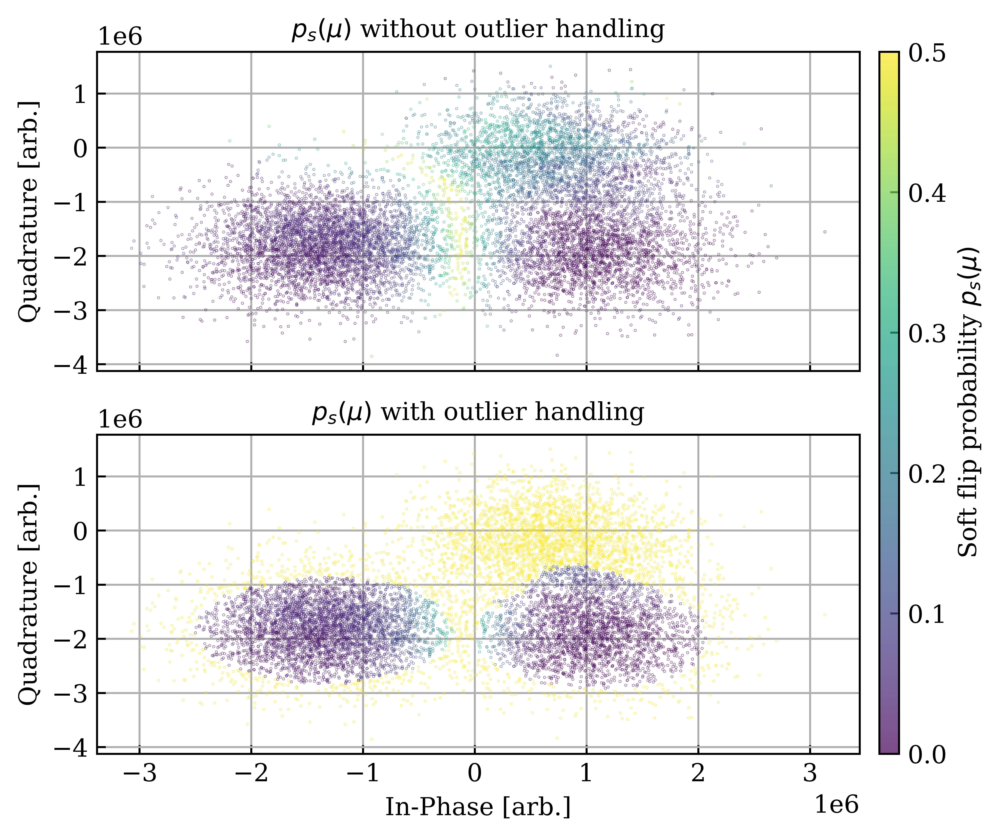

In [105]:
from soft_info import plot_double_IQ_scatter_outlier
qubit = 9
cols = inverted_q_map[qubit]
plot = plot_double_IQ_scatter_outlier(memory[:, cols], pSoft[:, cols], pSoft_processed[:, cols])